# Track Calculations

This notebook establishes a basic track.

In [1]:
%matplotlib inline

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import math
from matplotlib import animation, rc
from IPython.display import HTML

## Test Plot

X is size: 100, Y is size: 100


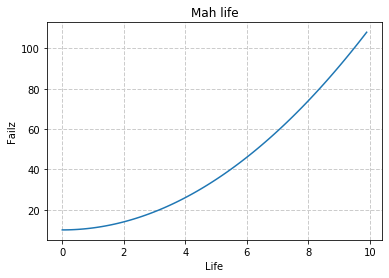

In [3]:
x = np.arange(0,10,0.1)
y = x**2 + 10
fig, ax = plt.subplots()
ax.grid(color='0.8', linestyle='--', linewidth=1)
ax.set_ylabel('Failz')
ax.set_xlabel('Life')
linez, =  ax.plot(x, y)
ax.set_title('Mah life')
print( "X is size: " +  str(len(x)) + ", Y is size: " + str(len(y)))

# Track Definition

(400, 2)


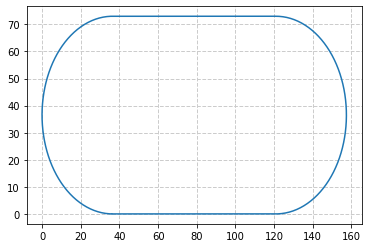

In [4]:
mid_track = 84.39 # Meters 
res = 1 # Meter Resolution 
r = 36.5 # Meters 
x_1 = np.transpose([np.arange(r, r + mid_track, res)])
y_1 = x_1*0 
theta = np.transpose([np.arange(-math.pi/2,math.pi/2,math.pi/(r*math.pi))]);
x_2 = r*np.cos(theta)+mid_track + r
y_2 = r*np.sin(theta)+r
x_3 = np.flip(x_1)
y_3 = x_1 * 0 + 2*r
theta2 = np.transpose([np.arange(math.pi/2,(3/2)*math.pi,math.pi/(r*math.pi))])
x_4 = r*np.cos(theta2)+r
y_4 = r*np.sin(theta2)+r
track = np.block([[x_1,y_1],[x_2,y_2],[x_3,y_3],[x_4,y_4]])
fig2, ax2 = plt.subplots()
ax2.grid(color='0.8', linestyle='--', linewidth=1)
line2, =ax2.plot(track[:,0], track[:,1])
print(np.shape(track))

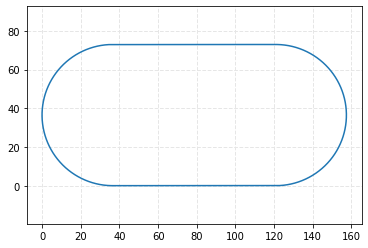

In [5]:
fig3, ax3 = plt.subplots()
ax3.grid(color='0.9', linestyle='--', linewidth=1)
ax3.set_axisbelow(True)
line3, =ax3.plot(track[:,0], track[:,1], zorder=1)
ax3.axis('equal')

sct1 = ax3.scatter([],[],marker='o',color='r',s=50,zorder=2)
def init():
    sct1 = ax3.scatter([],[],marker='o',color='r',s=80,zorder=2)
    return (line3,)

def animate(i):
    sct1.set_offsets((track[4*i,0],track[4*i,1]))
    return (sct1,)

anim = animation.FuncAnimation(fig3, animate, init_func=init,
                               frames=100, interval=40, 
                               blit=True)

In [6]:
HTML(anim.to_jshtml())

### Track With Beacons

Text(0.5, 1.0, '400M Track with 10 anchors')

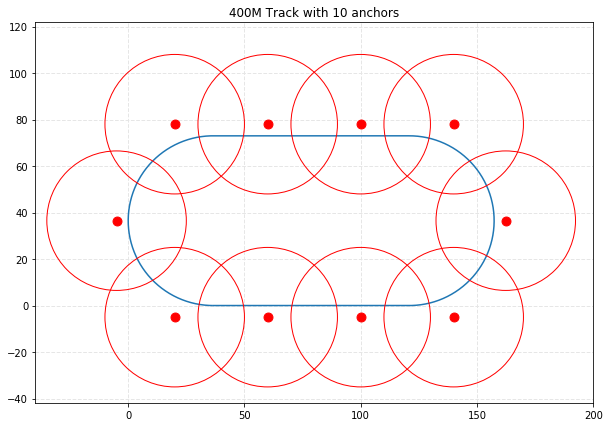

In [7]:
fig4, ax4 = plt.subplots()
ax4.grid(color='0.9', linestyle='--', linewidth=1)
ax4.set_axisbelow(True)
line4, =ax4.plot(track[:,0], track[:,1], zorder=1)
r_anchor = 30
d = 5
c_anch = 'r'
circles_l = [(-d,r),(20,-d),(60,-d),(100,-d),(140,-d),(mid_track+2*r+d,r),
            (20,2*r+d),(60,2*r+d),(100,2*r+d),(140,2*r+d)]
circle_obj = []
for circle in circles_l:
    circlez =(plt.Circle(circle, r_anchor, color=c_anch,fill=False))
    ax4.scatter(circle[0],circle[1],marker='o',color=c_anch,s=80,zorder=2)
    ax4.add_artist(circlez)
ax4.axis('equal')
ax4.set_xlim(-40,200)
ax4.set_ylim(-60,140)
fig4.set_size_inches(10,7)
ax4.set_title('400M Track with ' + str(len(circles_l)) + ' anchors')



In [8]:
sct4 = ax4.scatter([],[],marker='o',color='g',s=50,zorder=2)
line4, = ax4.plot([],[],color='g')
near_circle = plt.Circle([None,None],10,fill=False)
ax4.add_artist(near_circle)
def animate2(i):
    loc = track[i*4,:]
    sct4.set_offsets(loc)
    dd = np.array(circles_l) - loc
    min_c = np.argmin((dd[:,0]**2 + dd[:,1]**2)**(1/2))
    line4.set_data([loc[0],circles_l[min_c][0]], [loc[1],circles_l[min_c][1]])
    near_circle.set_center(circles_l[min_c])
    near_circle.set_radius((dd[min_c][0]**2 + dd[min_c][1]**2)**(1/2))
    return (sct4,)

anim2 = animation.FuncAnimation(fig4, animate2,
                               frames=100, interval=100, 
                               blit=True)
HTML(anim2.to_jshtml())

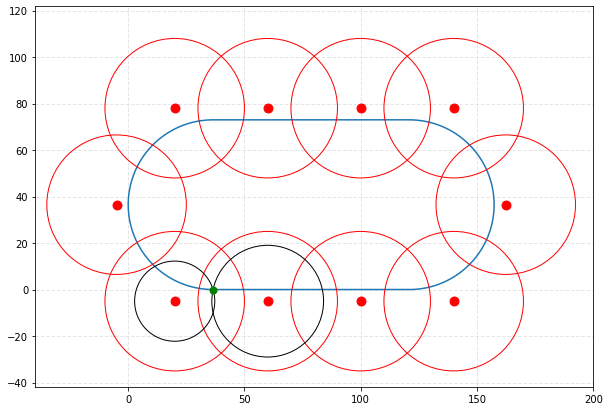

In [19]:
import json,codecs
fig5, ax5 = plt.subplots()
ax5.grid(color='0.9', linestyle='--', linewidth=1)
ax5.set_axisbelow(True)
line5, =ax5.plot(track[:,0], track[:,1], zorder=1)


circles_l = [(-d,r),(20,-d),(60,-d),(100,-d),(140,-d),(mid_track+2*r+d,r),
            (20,2*r+d),(60,2*r+d),(100,2*r+d),(140,2*r+d)]
circle_obj = []
for circle in circles_l:
    circlez =(plt.Circle(circle, r_anchor, color=c_anch,fill=False))
    ax5.scatter(circle[0],circle[1],marker='o',color=c_anch,s=80,zorder=2)
    ax5.add_artist(circlez)
ax5.axis('equal')
ax5.set_xlim(-40,200)
ax5.set_ylim(-60,140)
fig5.set_size_inches(10,7)

sct5 = ax5.scatter([],[],marker='o',color='g',s=50,zorder=2)
line5, = ax5.plot([],[],color='g')
near_circle = plt.Circle([None,None],10,fill=False)

dist_c = []
for i in np.arange(len(circles_l)):
    dist_c.append(plt.Circle([None,None],10,fill=False))
    ax5.add_artist(dist_c[i])
    
myArr = []
ax5.add_artist(near_circle)


# [  beacons:[ {loc:[x,y],d:d} ], location:[true_x,_true_y],        ]
dataArr = []
circs = np.array(circles_l)
for i in np.arange(100):
    loc = track[i*4,:]
    dd = circs - loc
    tag_d = (dd[:,0]**2 + dd[:,1]**2)**(1/2)
    beacons = np.block([circs, np.array([tag_d]).T])
    beacons = beacons[tag_d<r_anchor]
    dataArr.append({"bec":beacons,"loc":loc})


def animate3(i):
    myArr.append(i)
    loc = track[i*4,:]
    sct5.set_offsets(loc)
    dd = np.array(circles_l) - loc
    tag_d = (dd[:,0]**2 + dd[:,1]**2)**(1/2)
    for i in np.arange(len(circles_l)):
        dist = tag_d[i]
        if dist < r_anchor :
            dist_c[i].set_center([circles_l[i][0],circles_l[i][1]])
            dist_c[i].set_radius(dist)
        else : 
            dist_c[i].set_center([None,None])
            dist_c[i].set_radius(0)
    return (sct5,)

anim3 = animation.FuncAnimation(fig5, animate3,
                               frames=100, interval=100, 
                               blit=True)


class NumpyEncoder(json.JSONEncoder):
    def default(self, obj):
        if isinstance(obj, np.ndarray):
            return obj.tolist()
        return json.JSONEncoder.default(self, obj)

dataExport = {"track":track,"beacons":circs,"data":dataArr }
jsontext = json.dumps(dataExport,cls=NumpyEncoder)
f = open("trackData.json", "w")
f.write(jsontext)
f.close()

In [10]:
HTML(anim3.to_jshtml())

In [33]:
from numpy import linalg as lin
rt = track.T
print(np.shape(rt))
J = np.array([rt[0,:]**2,rt[1,:]**2,rt[0,:]*0])


J.T @ lin.pinv(J @ J.T) @ rt

(400,3)*(3,3)





(2, 400)


ValueError: matmul: Input operand 1 has a mismatch in its core dimension 0, with gufunc signature (n?,k),(k,m?)->(n?,m?) (size 2 is different from 3)

array([6, 7, 8, 9])

ValueError: all the input arrays must have same number of dimensions